In [1]:
from optparse import OptionParser
import json
import os
import pickle
import random
import re
import pandas as pd
import pysam
import h5py
import numpy as np

In [2]:
import tensorflow as tf
from basenji import seqnn, stream

2024-01-22 16:39:34.323699: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-01-22 16:39:34.357592: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-22 16:39:34.357643: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-22 16:39:34.358561: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-22 16:39:34.366213: I tensorflow/core/platform/cpu_feature_guar

In [3]:
os.environ["CUDA_VISIBLE_DEVICES"] = '-1' ### run on CPU

In [4]:
print(tf.config.list_physical_devices('GPU'))

[]


In [5]:
# from akita_utils.seq_gens import central_permutation_seqs_gen
from akita_utils.h5_utils import (initialize_stat_output_h5, write_stat_metrics_to_h5)
from akita_utils.seq_gens import central_permutation_seqs_gen

In [6]:
# arguments 

genome_fasta = "/project/fudenber_735/genomes/mm10/mm10.fa" 
out_dir = "./OUT"
stats = "SCD,INS-16,INS-64"
# stats = "SCD"
batch_size=8 
head_index = 1
model_index = 1
shifts = "0"
rc = False

In [7]:
# CTCT_table = "/home1/smaruj/akitaX1-analyses/input_data/preprocess_CTCFs/output/CTCFs_jaspar_filtered_mm10.tsv"
CTCT_table = "/home1/smaruj/akitaX1-analyses/experiments/genomic_disruption_experiment/reverse_compliment/top_SCD.tsv"

In [8]:
shifts = [int(shift) for shift in shifts.split(",")]
stats = stats.split(",")

In [9]:
models_dir="/project/fudenber_735/tensorflow_models/akita/v2/models"

In [10]:
params_file = models_dir + f"/f{model_index}c0" + "/train" + "/params.json"

In [11]:
params_file

'/project/fudenber_735/tensorflow_models/akita/v2/models/f1c0/train/params.json'

In [12]:
model_file = models_dir + f"/f{model_index}c0" + "/train" + f"/model{head_index}_best.h5"

In [13]:
model_file

'/project/fudenber_735/tensorflow_models/akita/v2/models/f1c0/train/model1_best.h5'

In [14]:
# read model parameters
with open(params_file) as params_open:
    params = json.load(params_open)
params_train = params["train"]
params_model = params["model"]

if batch_size is None:
    batch_size = params_train["batch_size"]
else:
    batch_size = batch_size

In [15]:
# load model
seqnn_model = seqnn.SeqNN(params_model)
seqnn_model.restore(model_file, head_i=head_index)
seqnn_model.build_ensemble(rc, shifts)
seq_length = int(params_model["seq_length"])

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 sequence (InputLayer)       [(None, 1310720, 4)]         0         []                            
                                                                                                  
 stochastic_reverse_complem  ((None, 1310720, 4),         0         ['sequence[0][0]']            
 ent (StochasticReverseComp   ())                                                                 
 lement)                                                                                          
                                                                                                  
 stochastic_shift (Stochast  (None, 1310720, 4)           0         ['stochastic_reverse_complemen
 icShift)                                                           t[0][0]']               

In [16]:
seq_length

1310720

In [17]:
# open genome FASTA
genome_open = pysam.Fastafile(genome_fasta)

In [18]:
seq_coords_df = pd.read_csv(CTCT_table, sep="\t")

In [20]:
# initialize output
stats_out = initialize_stat_output_h5(out_dir, model_file, stats, seq_coords_df)

In [21]:
seq_length= int(params_model["seq_length"])

In [22]:
chrom_sizes = "/project/fudenber_735/genomes/mm10/mm10.fa.sizes"

In [23]:
chrom_sizes_table = pd.read_csv(chrom_sizes, sep="\t", names=["chrom", "size"])

In [24]:
# preds_stream = stream.PredStreamGen(
#         seqnn_model,
#         central_permutation_rc_seqs_gen(seq_coords_df, genome_open, chrom_sizes_table),
#         batch_size,
#     )

preds_stream = stream.PredStreamGen(
        seqnn_model,
        central_permutation_seqs_gen(seq_coords_df, genome_open, chrom_sizes_table, revcomp=True),
        batch_size,
    )

In [25]:
num_experiments = len(seq_coords_df)

In [26]:
stats

['SCD', 'INS-16', 'INS-64']

In [27]:
from akita_utils.stats_utils import plot_map

In [28]:
from akita_utils.utils import ut_dense

In [29]:
from akita_utils.stats_utils import calculate_SCD

ref_index:  0
4/4 [==============================] - 18s 4s/step
rc_index:  1
exp_index:  0
ref


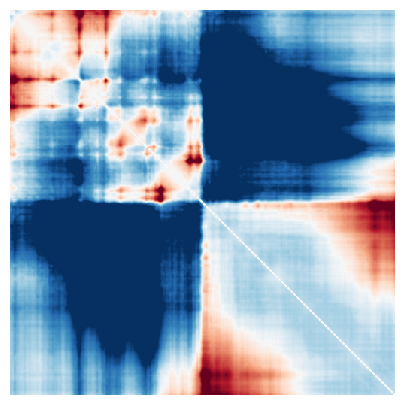

alt


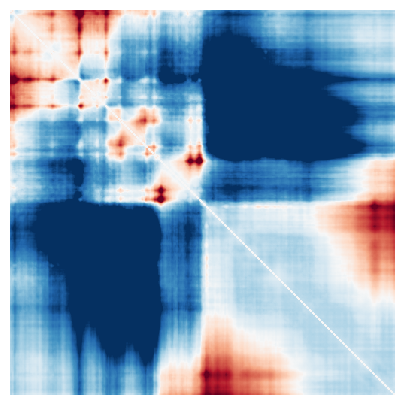

alt-ref


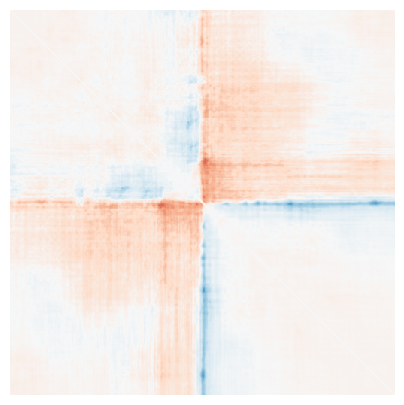

SCD, ref
[187.20721 198.89667 281.6292  282.0464  237.5236  203.12343]
SCD, alt
[172.61629 185.46973 253.7643  254.41164 212.54959 181.92844]
SCD, alt with ref
[23.242355 22.33936  41.838615 41.768982 34.480186 29.9537  ]
ref_index:  2
rc_index:  3
exp_index:  1
ref


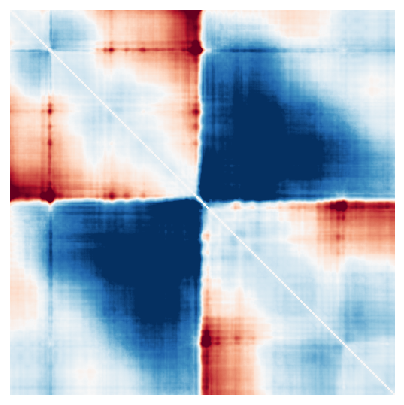

alt


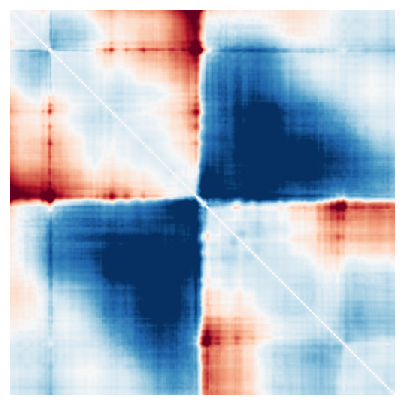

alt-ref


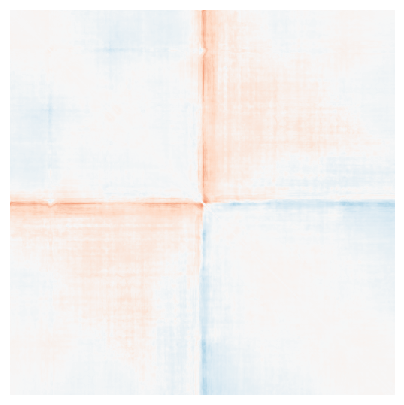

SCD, ref
[122.52903 151.43288 271.53766 273.5436  221.31218 197.12474]
SCD, alt
[115.334045 142.75572  224.65434  223.71785  190.39754  168.72629 ]
SCD, alt with ref
[13.9467745 13.920642  49.346516  52.07584   33.555843  30.7558   ]
ref_index:  4
rc_index:  5
exp_index:  2
ref


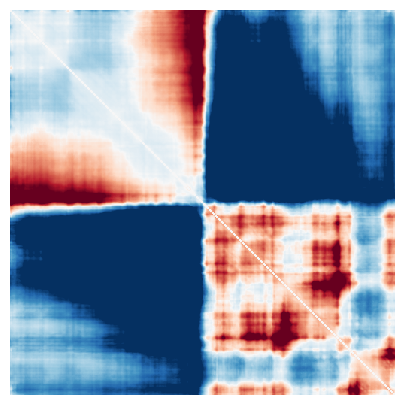

alt


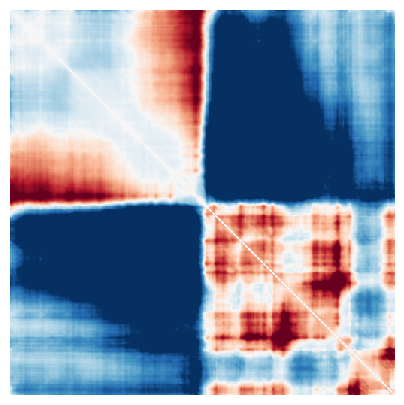

alt-ref


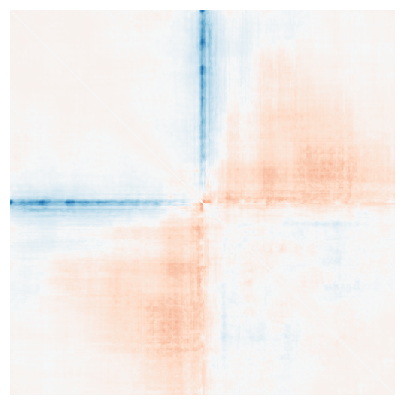

SCD, ref
[224.79338 207.91602 265.26672 261.40192 234.46205 196.92479]
SCD, alt
[211.8867  198.41309 228.7754  223.98465 205.86232 171.89574]
SCD, alt with ref
[23.562212 19.841625 38.555584 39.26172  31.114124 27.127703]
ref_index:  6
rc_index:  7
exp_index:  3
ref


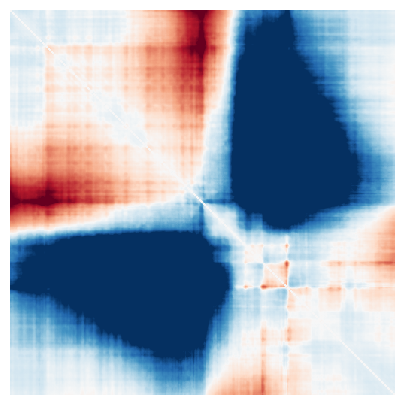

alt


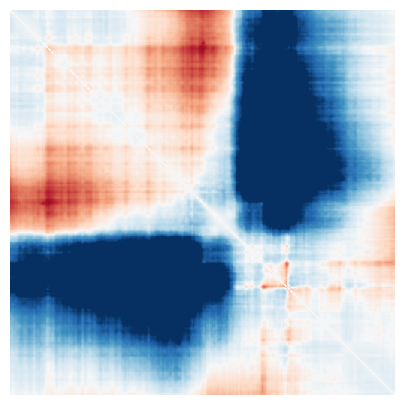

alt-ref


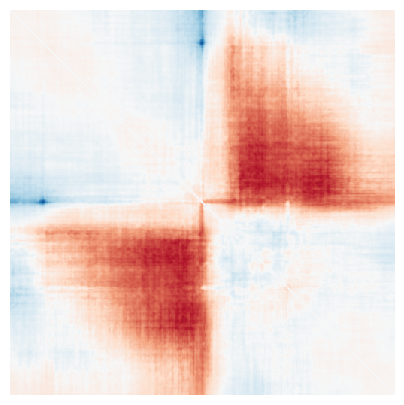

SCD, ref
[209.75307 214.55074 222.01025 218.78088 205.32085 173.05884]
SCD, alt
[159.91508  158.61427  135.47383  127.820045 130.25143  107.131195]
SCD, alt with ref
[59.251556 65.25525  96.312004 99.5009   82.81972  71.740715]
ref_index:  8
rc_index:  9
exp_index:  4
ref


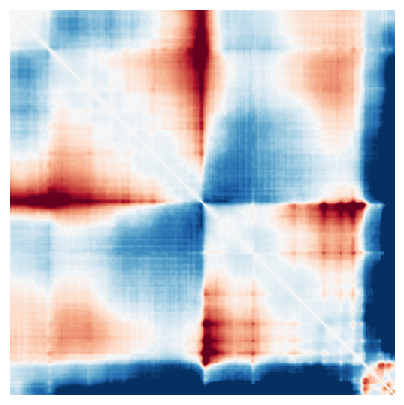

alt


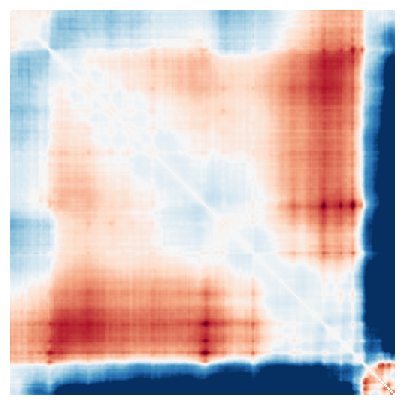

alt-ref


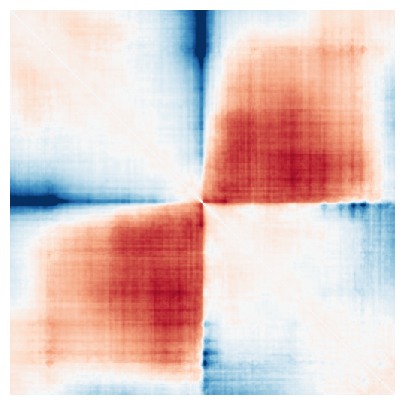

SCD, ref
[114.040375 123.91193  124.482994 116.07942  115.70265   98.24461 ]
SCD, alt
[115.89665 124.10311  77.99194  71.62618  86.21986  71.42057]
SCD, alt with ref
[ 75.826454  88.38952  119.08184  111.01913  105.910576  91.69727 ]
ref_index:  10
rc_index:  11
exp_index:  5
ref


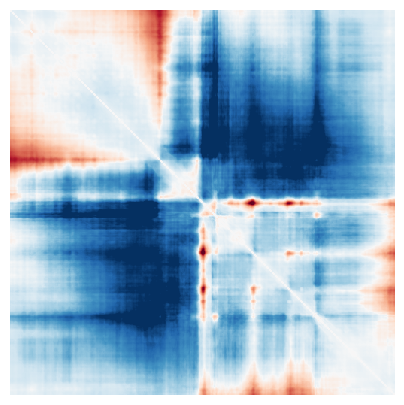

alt


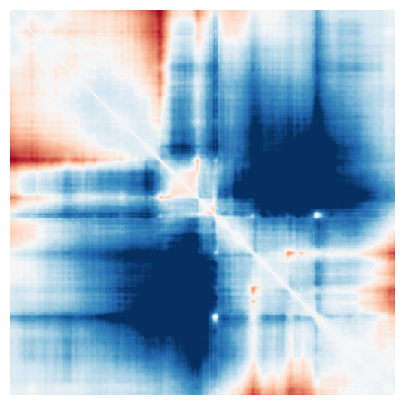

alt-ref


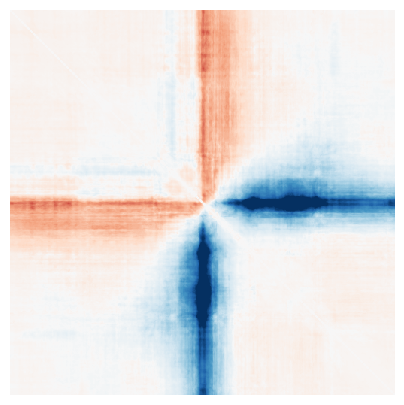

SCD, ref
[113.011856 136.22777  198.47078  204.75739  167.83217  148.62538 ]
SCD, alt
[124.77207 150.63991 186.05626 193.26761 164.70265 144.59657]
SCD, alt with ref
[54.491043 59.01085  54.726463 54.602512 53.550133 47.252525]
ref_index:  12
rc_index:  13
exp_index:  6
ref


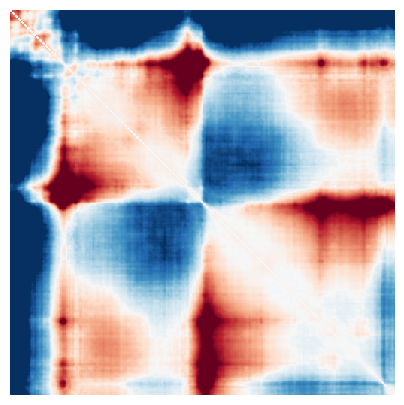

alt


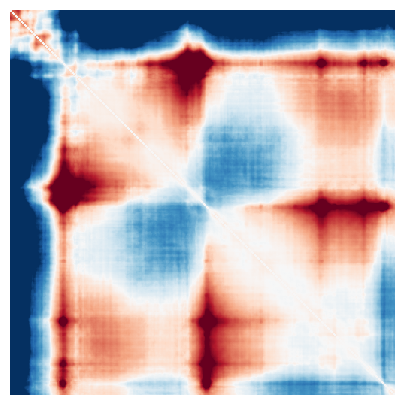

alt-ref


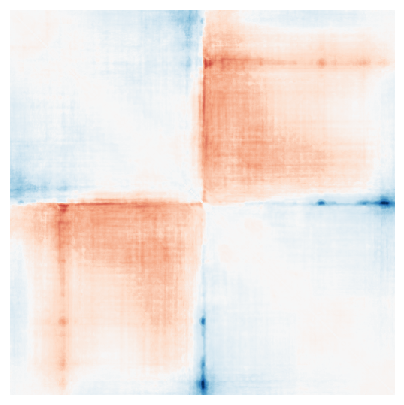

SCD, ref
[157.99959  165.60873  153.51656  145.32895  152.31146  127.676575]
SCD, alt
[152.35515  157.62422  141.7991   134.65356  142.62624  119.533195]
SCD, alt with ref
[35.366646 40.440716 50.91676  49.5929   45.929535 40.207775]
ref_index:  14
rc_index:  15
exp_index:  7
ref


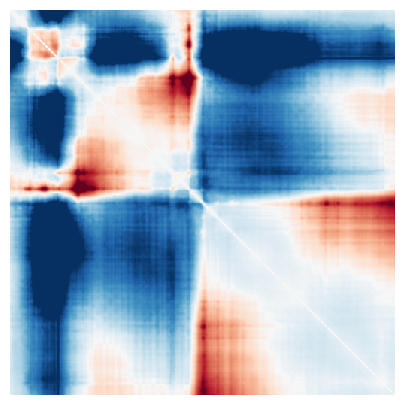

alt


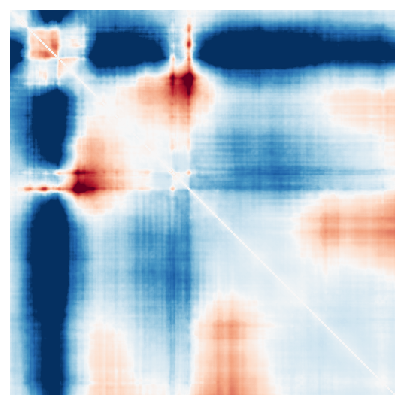

alt-ref


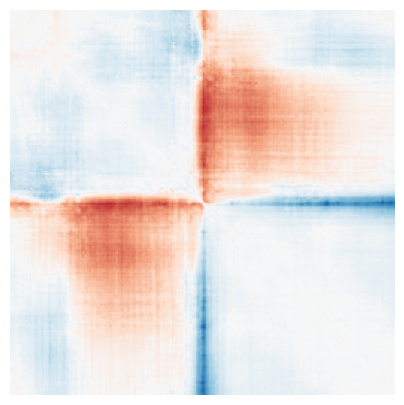

SCD, ref
[132.03552 146.9637  149.88837 147.4477  136.97356 116.72455]
SCD, alt
[118.097145 118.2386    85.471924  81.101265  85.814384  69.6591  ]
SCD, alt with ref
[42.9867   51.918037 74.912    76.82409  62.246544 56.418762]
ref_index:  16
rc_index:  17
exp_index:  8
ref


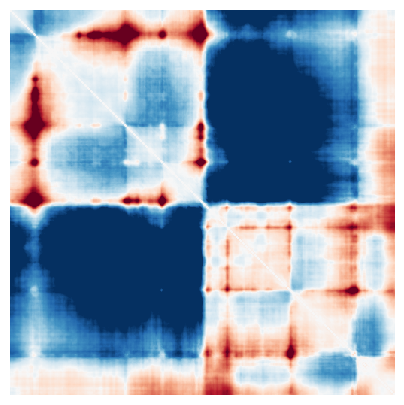

alt


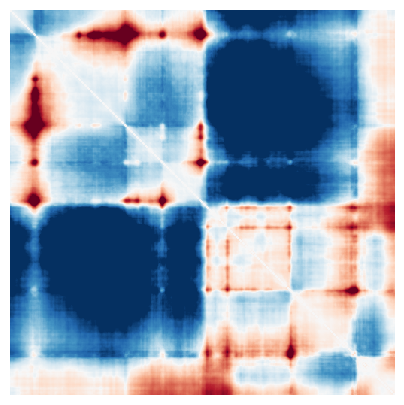

alt-ref


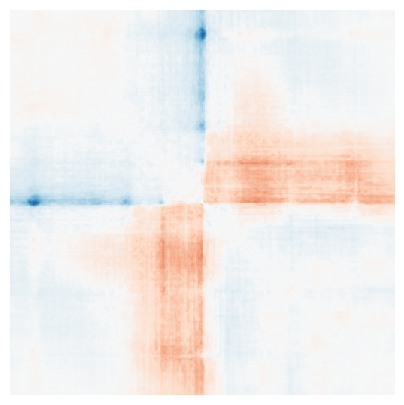

SCD, ref
[171.96094 175.96368 183.95    180.3511  172.32678 149.23097]
SCD, alt
[162.39627 166.62917 159.08482 154.69382 152.75563 131.56223]
SCD, alt with ref
[26.185862 27.488892 36.589592 37.53003  32.81215  29.149166]
ref_index:  18
rc_index:  19
exp_index:  9
ref


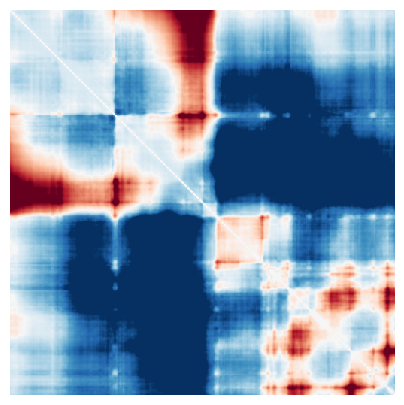

alt


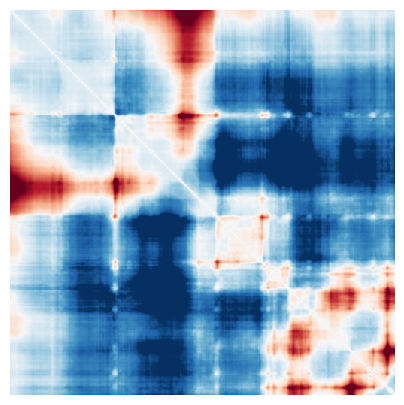

alt-ref


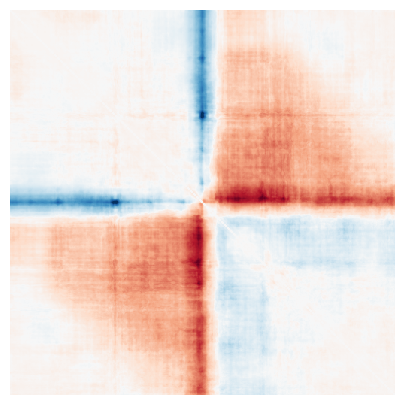

SCD, ref
[165.9308  166.36502 195.50363 195.99162 182.22255 158.88525]
SCD, alt
[128.84518  130.399    148.12956  146.74583  138.15608  120.151855]
SCD, alt with ref
[51.825855 50.738716 65.54091  66.36935  59.478634 52.322624]
ref_index:  20
rc_index:  21
exp_index:  10
ref


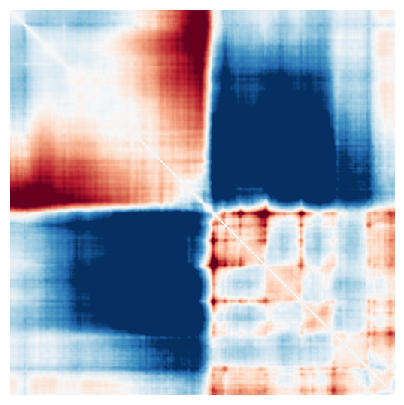

alt


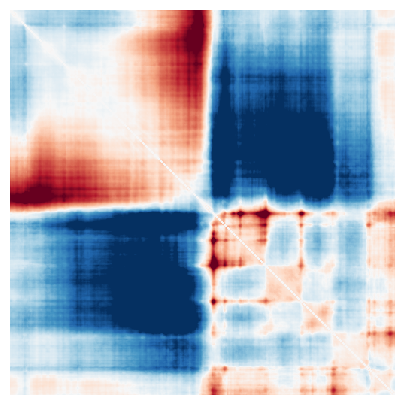

alt-ref


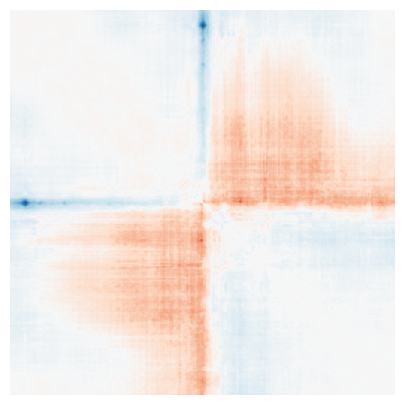

SCD, ref
[155.36475 164.58281 195.95892 194.81123 169.52707 143.2434 ]
SCD, alt
[133.06886  141.78929  150.94206  146.92114  132.03333  109.877144]
SCD, alt with ref
[28.548048 28.5508   49.574677 51.98038  41.47953  36.73964 ]
ref_index:  22
rc_index:  23
exp_index:  11
ref


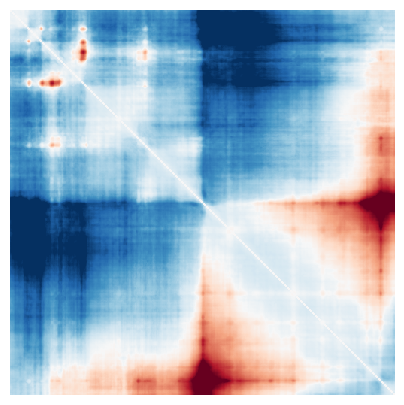

alt


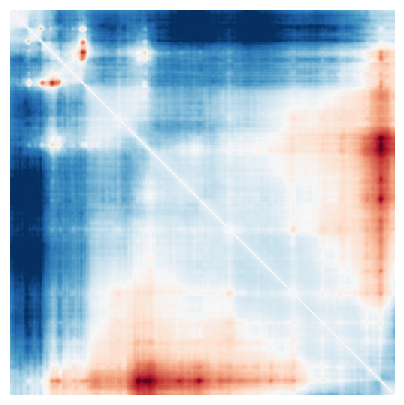

alt-ref


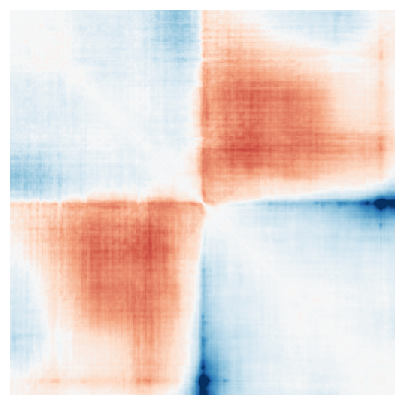

SCD, ref
[113.11989  130.31232  116.685486 114.87473  120.62323  101.730644]
SCD, alt
[ 94.542885 101.203186  75.789925  75.88641   84.71136   71.33932 ]
SCD, alt with ref
[56.611378 73.19163  78.74829  74.2719   75.75167  62.461716]
ref_index:  24
rc_index:  25
exp_index:  12
ref


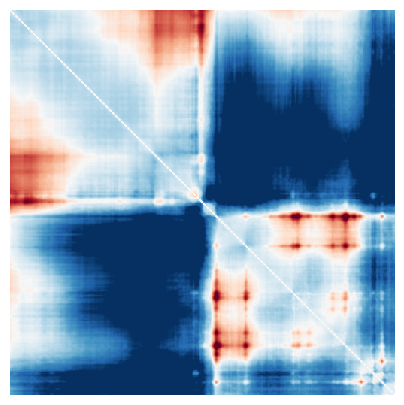

alt


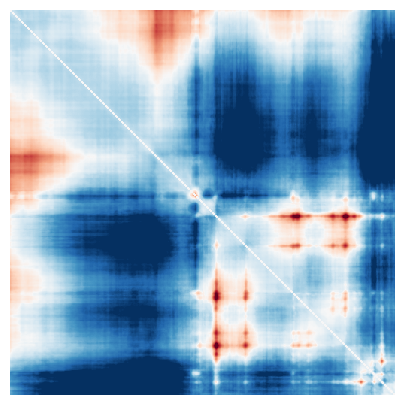

alt-ref


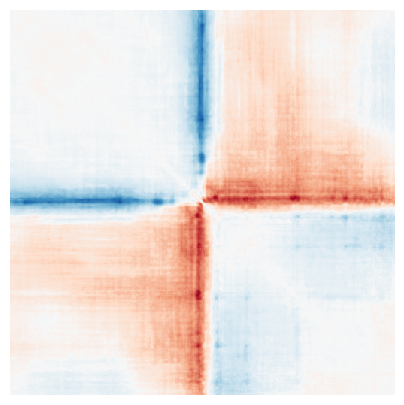

SCD, ref
[152.43518 175.90707 185.99492 185.941   177.93816 154.35478]
SCD, alt
[132.24402 150.00323 138.9693  140.39081 137.85887 117.33403]
SCD, alt with ref
[43.534042 46.987537 61.69307  60.789337 54.734795 49.529514]
ref_index:  26
rc_index:  27
exp_index:  13
ref


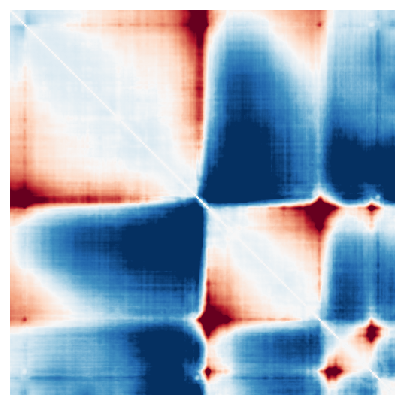

alt


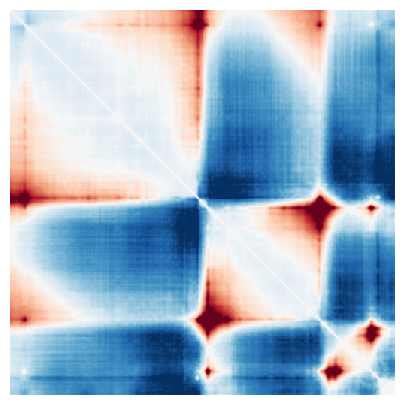

alt-ref


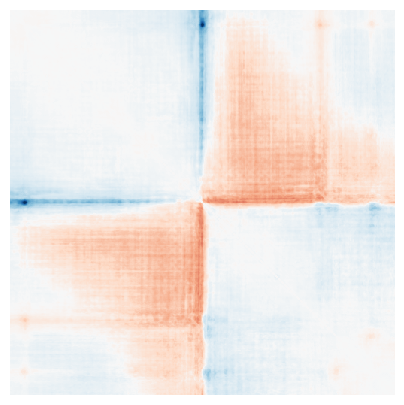

SCD, ref
[130.55434 147.56575 198.37135 185.52623 178.36784 155.7121 ]
SCD, alt
[111.17624 125.51161 149.26659 136.97592 140.67163 120.80861]
SCD, alt with ref
[31.263655 33.542625 58.93782  57.907276 47.366177 43.111797]
ref_index:  28
rc_index:  29
exp_index:  14
ref


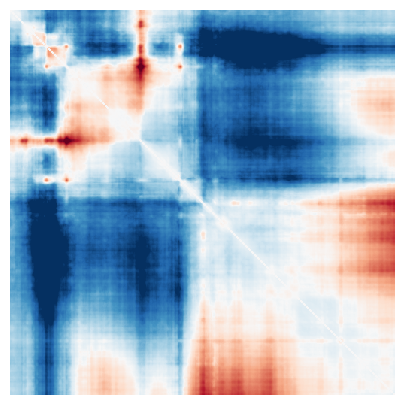

alt


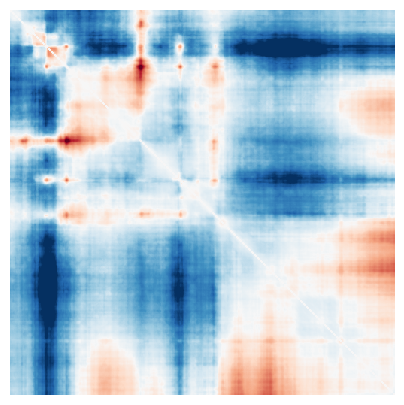

alt-ref


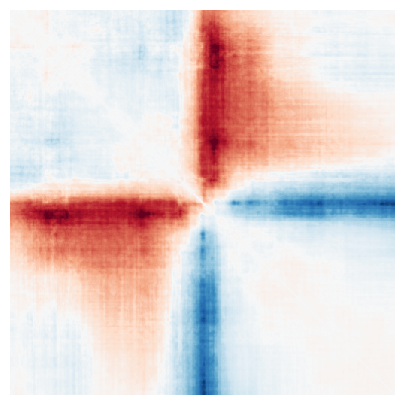

SCD, ref
[118.680885 134.55603  132.7428   133.33553  127.221855 106.73977 ]
SCD, alt
[92.855385 95.15747  72.04907  69.60614  74.94158  61.006092]
SCD, alt with ref
[65.41693 77.98851 80.0547  82.40063 75.74461 65.24483]
ref_index:  30
rc_index:  31
exp_index:  15
ref


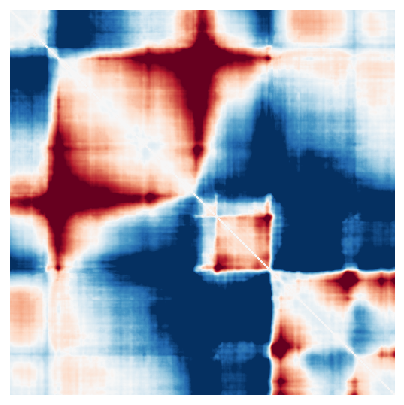

alt


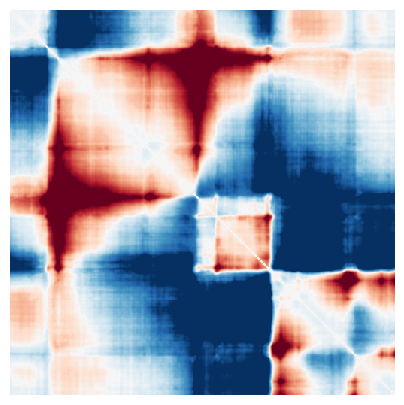

alt-ref


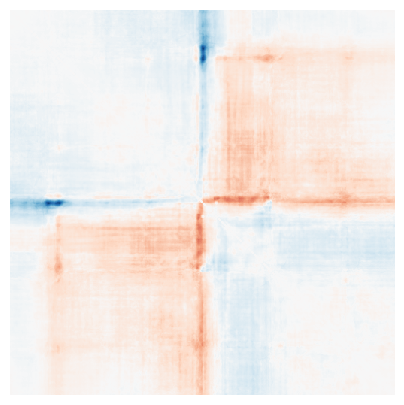

SCD, ref
[165.62004 172.17229 266.38654 266.90656 227.84024 201.97958]
SCD, alt
[156.99147 162.27586 242.87787 241.57695 209.65144 185.55084]
SCD, alt with ref
[25.362549 25.367317 43.792114 45.245754 36.53748  32.56366 ]
ref_index:  32


In [ ]:
for ref_index in range(0, num_experiments*2, 2):

    print("ref_index: ", ref_index)
    
    ref_preds_matrix = preds_stream[ref_index]
    permut_index = ref_index + 1

    print("rc_index: ", permut_index)
    
    rc_permuted_preds_matrix = preds_stream[permut_index]
    exp_index = ref_index//2

    print("exp_index: ", exp_index)

    ref_maps_t0 = ut_dense(ref_preds_matrix)
    alt_maps_t0 = ut_dense(rc_permuted_preds_matrix)

    print("ref")
    plot_map(ref_maps_t0[:,:,0])
    print("alt")
    plot_map(alt_maps_t0[:,:,0])
    print("alt-ref")
    plot_map(alt_maps_t0[:,:,0] - ref_maps_t0[:,:,0])

    print("SCD, ref")
    print(calculate_SCD(ref_maps_t0))
    print("SCD, alt")
    print(calculate_SCD(alt_maps_t0))
    print("SCD, alt with ref")
    print(calculate_SCD(alt_maps_t0, ref_maps_t0))
    
    # write_stat_metrics_to_h5(
    #         rc_permuted_preds_matrix,
    #         ref_preds_matrix,
    #         stats_out,
    #         exp_index,
    #         head_index,
    #         model_index,
    #         diagonal_offset=2,
    #         stat_metrics=stats,
    #     )

In [ ]:
for key in stats_out:
    print(key)

In [ ]:
stats_out["SCD_h1_m1"][:]

In [ ]:
stats_out["SSD_h1_m1"][:]

In [ ]:
stats_out["ref_INS-16_h1_m1"][:]

In [ ]:
stats_out["alt_INS-16_h1_m1"][:]

In [ ]:
stats_out.close()